In [1]:
import glob
import scanpy as sc
import muon as mu
import numpy as np
import pandas as pd
import loompy as lp
import seaborn as sns
import decoupler as dc
import torch
import matplotlib.pyplot as plt
import seaborn as sns

sc.settings.n_jobs = 16
sc.set_figure_params(dpi=100,dpi_save=800, figsize=(5,5), frameon=False)
%config InlineBackend.figure_format='retina'

In [2]:
noci_mdata = mu.read('./Results_h5ad/05_noci_mdata_subcluster_CytoTRACE.h5mu')

In [ ]:
# script in this block was run in cluster with all the above packages were loaded

# noci_mdata['rna'].obs['NociceptiveType'] = noci_mdata.obs.NociceptiveType.copy()
# noci_mdata['rna'].obs['scANVI_pred'] = noci_mdata.obs.scANVI_pred.copy()
# noci_mdata = noci_mdata[noci_mdata.obs.NociceptiveType == 'Nociceptors']
# adata = noci_mdata['rna'].copy()

# count = torch.distributions.negative_binomial.NegativeBinomial(torch.Tensor(adata.layers['scVI_gene']), logits=True).sample()

# from scipy.sparse import csr_matrix
# adata.layers['NB_counts'] = csr_matrix(np.array(count))
# del count
# del adata.layers['scVI_gene']

# adata.X = adata.layers['NB_counts'].copy()
# adata=sc.AnnData(adata.X,obs=adata.obs,var=adata.var)
# adata.var["Gene"]=adata.var_names
# adata.obs["CellID"]=adata.obs_names
# adata.write_loom("./scenic/adata_noci.loom")

In [ ]:
#!/bin/bash -l
# run the bash script chunk in the cluster environment with singularity
singularity run aertslab-pyscenic-0.12.1.sif \
    arboreto_with_multiprocessing.py \
        --num_workers 20 \
        -o ./scenic/adjacencies_noci.tsv \
        ./scenic/adata_noci.loom \
        ./scenic/mm_mgi_tfs.txt

singularity run aertslab-pyscenic-0.12.1.sif \
    pyscenic ctx \
        ./scenic/adjacencies_noci.tsv \
        ./scenic/cisTarget_databases/mm10__refseq-r80__10kb_up_and_down_tss.mc9nr.genes_vs_motifs.rankings.feather \
        ./scenic/cisTarget_databases/mm10__refseq-r80__500bp_up_and_100bp_down_tss.mc9nr.genes_vs_motifs.rankings.feather \
        --annotations_fname ./scenic/cisTarget_databases/motifs-v9-nr.mgi-m0.001-o0.0.tbl \
        --expression_mtx_fname ./scenic/adata_noci.loom \
        --mode "dask_multiprocessing" \
        --output ./scenic/regulons_noci.csv \
        --num_workers 20

singularity run aertslab-pyscenic-0.12.1.sif \
    pyscenic aucell \
        ./scenic/adata_noci.loom \
        ./scenic/regulons_noci.csv \
        -o ./scenic/scenic_noci.loom \
        --num_workers 20

In [3]:
lf = lp.connect("./scenic/scenic_noci.loom", mode='r+', validate=False )
auc_mtx = pd.DataFrame(lf.ca.RegulonsAUC, index=lf.ca.CellID)
regulons = lf.ra.Regulons

In [4]:
res=pd.concat([pd.Series(r.tolist(),index=regulons.dtype.names) for r in regulons],axis=1)

In [5]:
res.columns=lf.row_attrs["var_names"]

In [6]:
adata=sc.AnnData(auc_mtx,obs=noci_mdata.obs,uns=noci_mdata.uns,obsm=noci_mdata.obsm)
adata.obs = adata.obs[['modality', 'Source', 'Age', 'Sex', 'Strains', 'Conditions', 'Time', 'scANVI_pred', 'MetaType', 'NociceptiveType', 'Injury_state', 'PainState', 'Time_Ref', 'subtype', 'Time_new', 'mixed_currents', 'current_Type_1', 'current_Type_2', 'leiden_subcluster', 'Injured', 'umap_density_Time_Ref', 'Entropy', 'CytoTRACE']]

/var/folders/pg/_gfvzhnj3zxc0lm8r3cm3jc00000gn/T/ipykernel_41997/257895653.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata=sc.AnnData(auc_mtx,


In [7]:
adata_genes = noci_mdata['rna'].copy()
genes=adata_genes.var_names
common=genes[genes.isin(np.array(list(map(lambda x: x.split("(")[0],adata.var_names))))]
adata=adata[:,common+"(+)"]
adata_genes=adata_genes[:,common]
adata.layers["auc_init"]=adata.X.copy()
weights=adata_genes.X.copy()
weights[weights>1]=1
adata.X=adata.X*weights.A
adata.layers["weigths"]=weights

In [8]:
adata.layers['SCENIC'] = adata.X

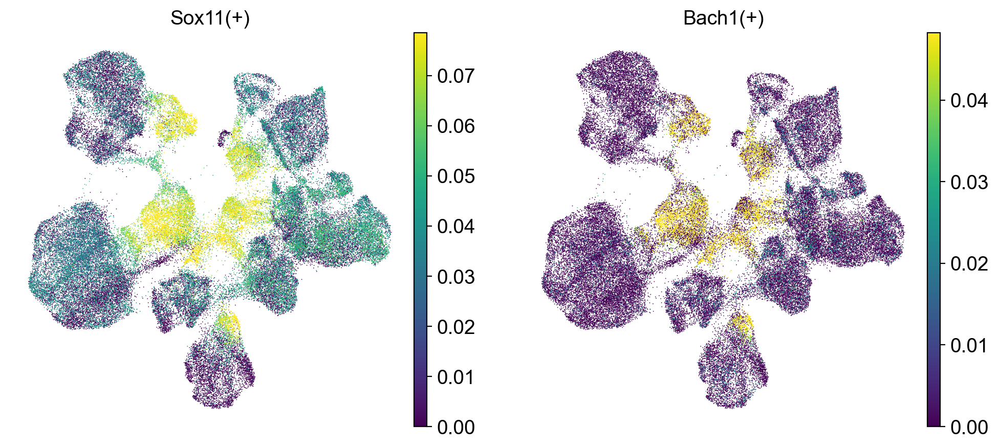

In [9]:
sc.pl.embedding(adata,color=["Sox11(+)", "Bach1(+)"], basis='X_umapSCANVI', vmin='p5', vmax='p95')

In [10]:
sc.pp.filter_genes(adata,min_cells=10)

In [11]:
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_neighbors=50)
sc.tl.leiden(adata, key_added='leiden_scenic', resolution=0.1)
sc.tl.umap(adata)

/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


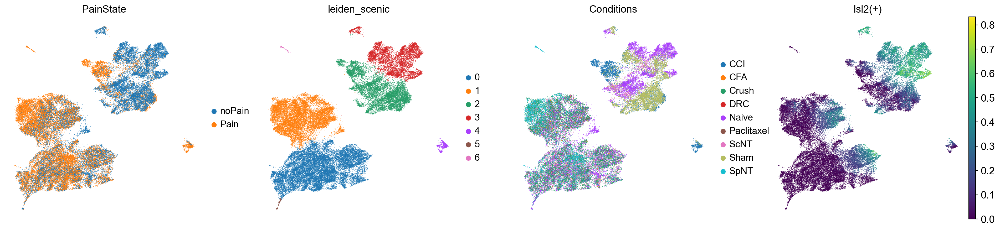

In [12]:
sc.pl.umap(adata, color=['PainState','leiden_scenic','Conditions','Isl2(+)'])

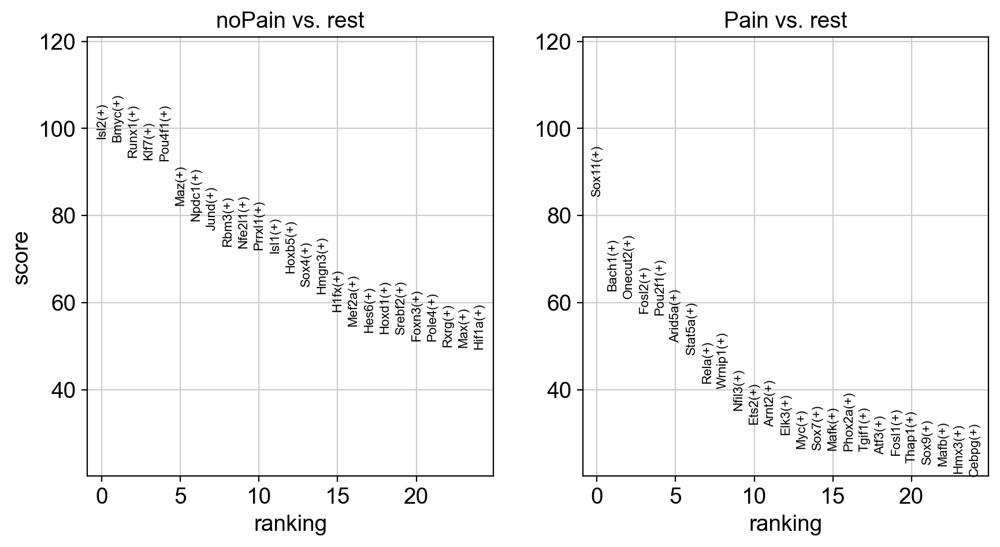

In [13]:
sc.tl.rank_genes_groups(adata, groupby='PainState', method='t-test_overestim_var', layer='SCENIC')
sc.pl.rank_genes_groups(adata, n_genes=25)

In [14]:
sc.pp.scale(adata)
adata.layers['scaled'] = adata.X.copy()

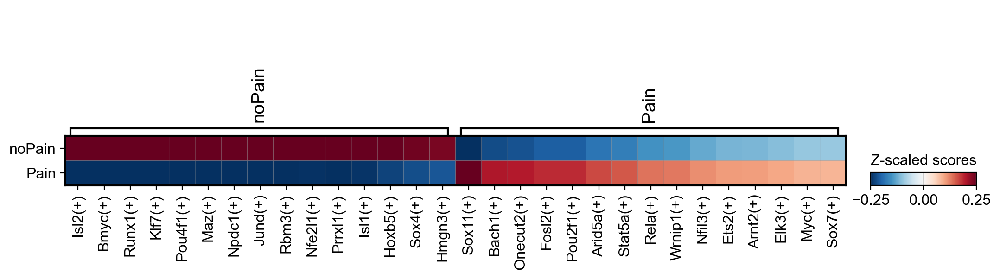

In [15]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=15, vmin=-.25, vmax=.25, cmap='RdBu_r',colorbar_title='Z-scaled scores', layer='scaled')

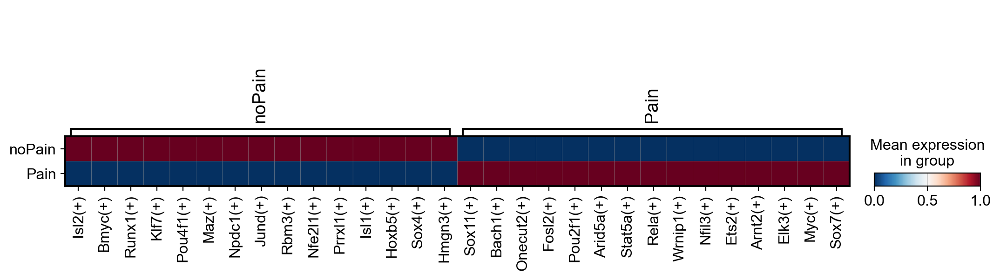

In [16]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=15, cmap='RdBu_r', layer='SCENIC', log=True, standard_scale='var')

In [18]:
adata_rna = noci_mdata['rna'].copy()

In [19]:
import scFates as scf
scf.pp.batch_correct(adata_rna, batch_key='Source', layer='NB_counts', depth_scale=1e4)

Performing pagoda2 batch correction
    depth scaling
    finished (0:00:28) --> updated 
    .layer['NB_counts'], batch corrected matrix.


In [20]:
# noci_df = pd.read_parquet('./noci_df.parquet')
# noci_df = sc.AnnData(noci_df)
# sc.pp.normalize_total(noci_df, target_sum=None)
sc.pp.log1p(adata_rna)
sc.pp.scale(adata_rna)
noci_df = adata_rna.to_df()
del adata_rna

In [21]:
df_tf = pd.read_table("./scenic/adjacencies_noci.tsv")

In [22]:
res, p = dc.run_ulm(
    mat=noci_df,
    net=df_tf,
    source='TF',
    target='target',
    weight='importance',
    verbose=True
)

9 features of mat are empty, they will be removed.
Running ulm on mat with 76203 samples and 20093 targets for 1446 sources.


In [23]:
adata_TF=sc.AnnData(res,
           obs=noci_mdata.obs,uns=noci_mdata.uns,obsm=noci_mdata.obsm)
adata_TF.obs = adata_TF.obs[['modality', 'Source', 'Age', 'Sex', 'Strains', 'Conditions', 'Time', 'scANVI_pred', 'MetaType', 'NociceptiveType', 'Injury_state', 'PainState', 'Time_Ref', 'subtype', 'Time_new', 'mixed_currents', 'current_Type_1', 'current_Type_2', 'leiden_subcluster', 'Injured', 'umap_density_Time_Ref', 'Entropy', 'CytoTRACE']]
adata_TF.layers['TF_act'] = adata_TF.X.copy()
adata_TF.layers['TF_pvals'] = p.values

/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


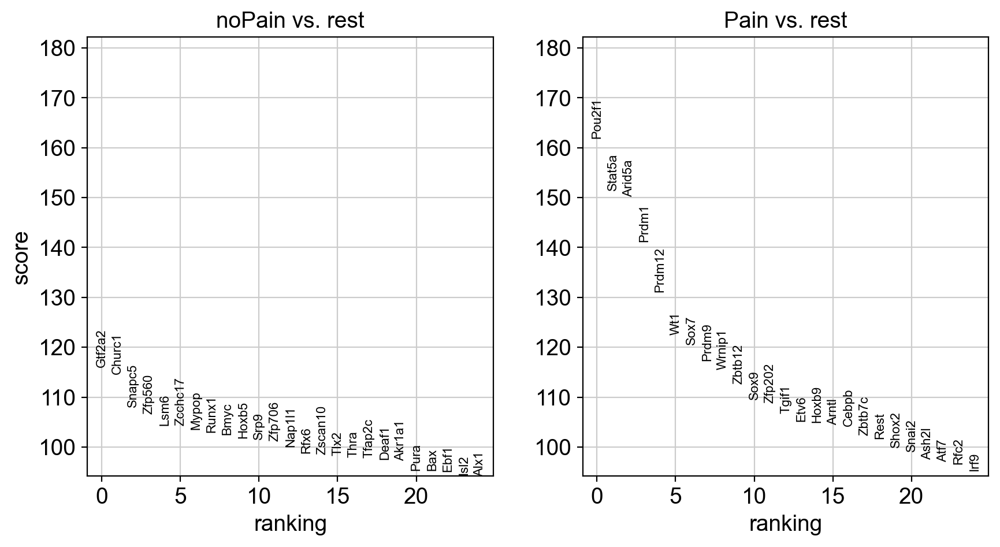

In [24]:
sc.tl.rank_genes_groups(adata_TF, groupby='PainState', method='t-test_overestim_var')
sc.pl.rank_genes_groups(adata_TF, n_genes=25)

In [25]:
sc.pp.scale(adata_TF)
adata_TF.layers['scaled'] = adata_TF.X.copy()

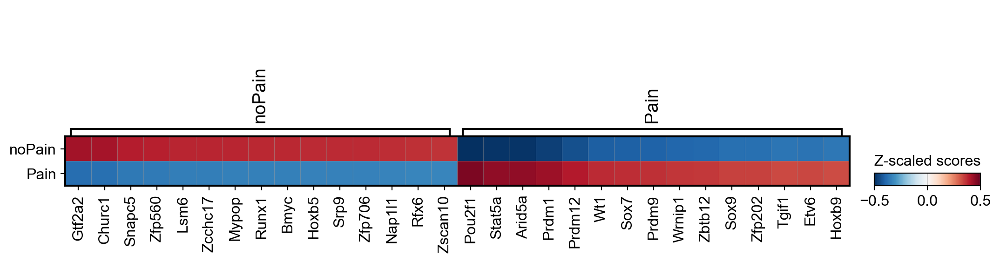

In [26]:
sc.pl.rank_genes_groups_matrixplot(adata_TF, n_genes=15, vmin=-0.5, vmax=0.5, cmap='RdBu_r',colorbar_title='Z-scaled scores', layer='scaled')

/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/pandas/core/internals/blocks.py:329: RuntimeWarning: invalid value encountered in log1p
  result = func(self.values, **kwargs)


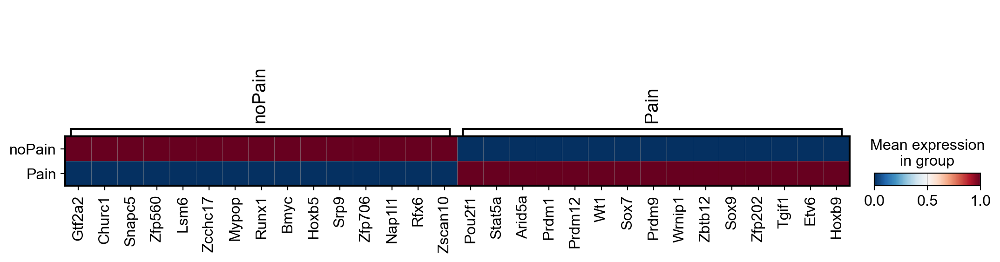

In [27]:
sc.pl.rank_genes_groups_matrixplot(adata_TF, n_genes=15, cmap='RdBu_r', layer='TF_act', log=True, standard_scale='var')

In [28]:
adata_TF.obsm['X_umapSCANVI'] = adata_TF.obsm['X_umap'].copy()

In [29]:
adata_TF.var['TF'] = adata_TF.var_names

In [30]:
adata_TF.var_names = 'TF:' + adata_TF.var_names.astype(str)

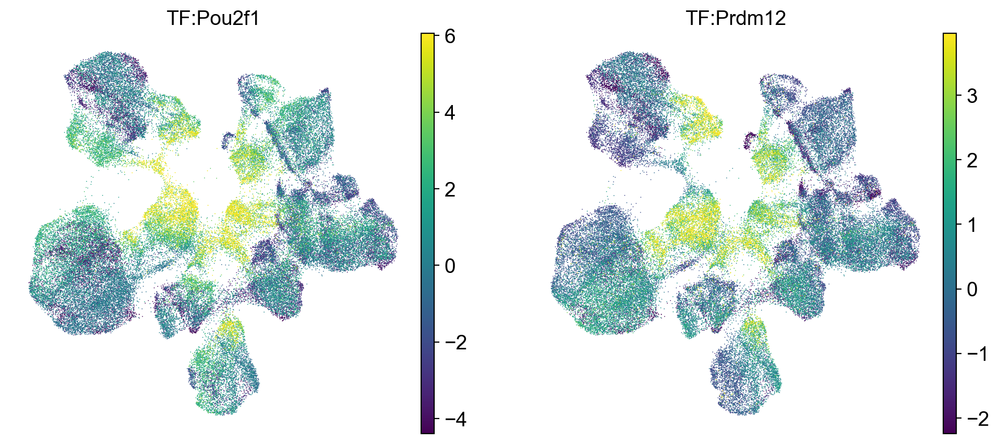

In [54]:
sc.pl.umap(adata_TF, color=['TF:Pou2f1','TF:Prdm12'], layer='TF_act', vmin='p5', vmax='p97')

In [32]:
noci_mdata.mod['SCENIC'] = adata
noci_mdata.update()
noci_mdata.mod['TF_activity'] = adata_TF
noci_mdata.update()

In [47]:
for mod in noci_mdata.mod.keys():
    noci_mdata[mod].var['Mod'] = mod

In [53]:
noci_mdata.write('./Results_h5ad/06_noci_mdata_SCENIC_TF.h5mu')

/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/anndata/_core/anndata.py:1235: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[key] = c


In [210]:
noci_mdata = mu.read('./Results_h5ad/06_noci_mdata_SCENIC_TF.h5mu')

In [3]:
noci_mdata['SCENIC'].X = noci_mdata['SCENIC'].layers['SCENIC']

/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/muon/_core/plot.py:243: UserWarning: Layer scVI_gene is not present for the modality SCENIC, using count matrix instead
  warnings.warn(
/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/muon/_core/plot.py:243: UserWarning: Layer scVI_gene is not present for the modality TF_activity, using count matrix instead
  warnings.warn(


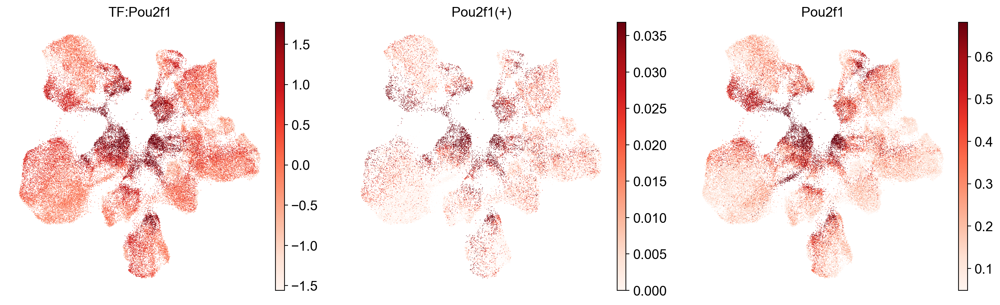

/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/muon/_core/plot.py:243: UserWarning: Layer scVI_gene is not present for the modality SCENIC, using count matrix instead
  warnings.warn(
/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/muon/_core/plot.py:243: UserWarning: Layer scVI_gene is not present for the modality TF_activity, using count matrix instead
  warnings.warn(


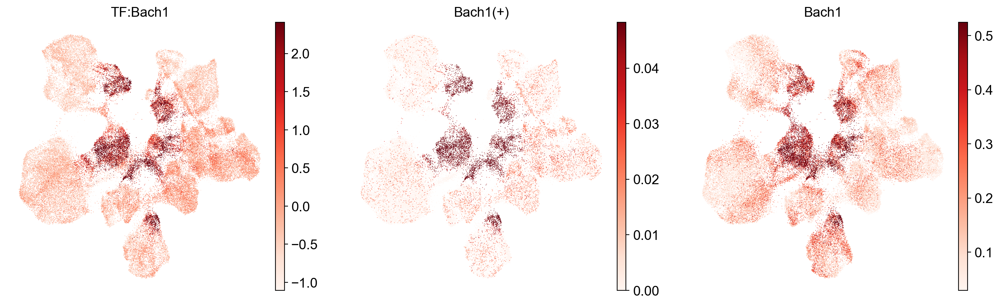

/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/muon/_core/plot.py:243: UserWarning: Layer scVI_gene is not present for the modality SCENIC, using count matrix instead
  warnings.warn(
/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/muon/_core/plot.py:243: UserWarning: Layer scVI_gene is not present for the modality TF_activity, using count matrix instead
  warnings.warn(


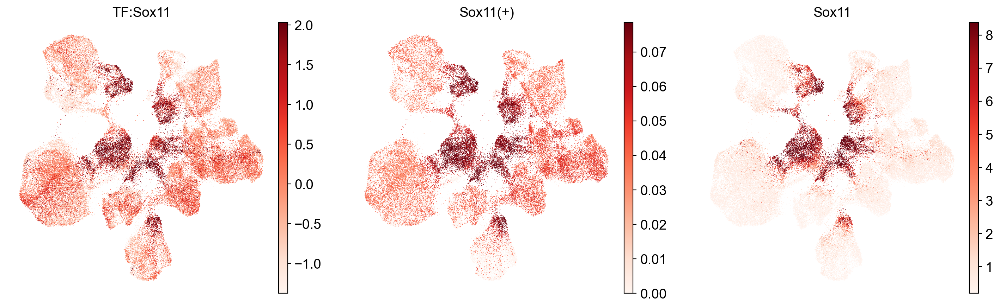

/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/muon/_core/plot.py:243: UserWarning: Layer scVI_gene is not present for the modality SCENIC, using count matrix instead
  warnings.warn(
/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/muon/_core/plot.py:243: UserWarning: Layer scVI_gene is not present for the modality TF_activity, using count matrix instead
  warnings.warn(


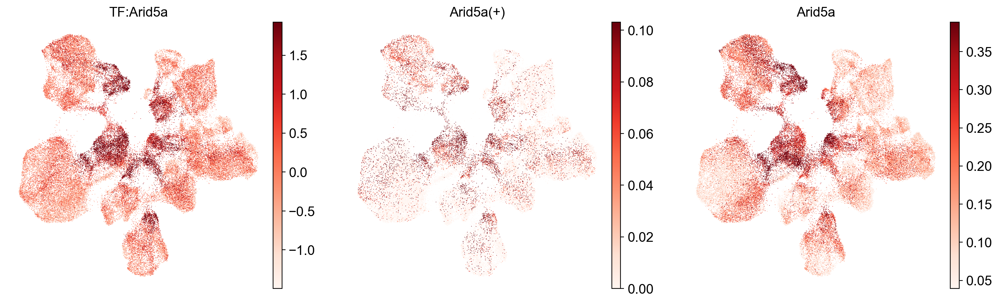

In [51]:
mu.pl.umap(noci_mdata, color=['TF:Pou2f1', 'Pou2f1(+)','Pou2f1'], vmin='p5', vmax='p95', layer='scVI_gene', cmap='Reds')
mu.pl.umap(noci_mdata, color=['TF:Bach1', 'Bach1(+)','Bach1'], vmin='p5', vmax='p95', layer='scVI_gene', cmap='Reds')
mu.pl.umap(noci_mdata, color=['TF:Sox11', 'Sox11(+)','Sox11'], vmin='p5', vmax='p95', layer='scVI_gene', cmap='Reds')
mu.pl.umap(noci_mdata, color=['TF:Arid5a', 'Arid5a(+)','Arid5a'], vmin='p5', vmax='p95', layer='scVI_gene', cmap='Reds')

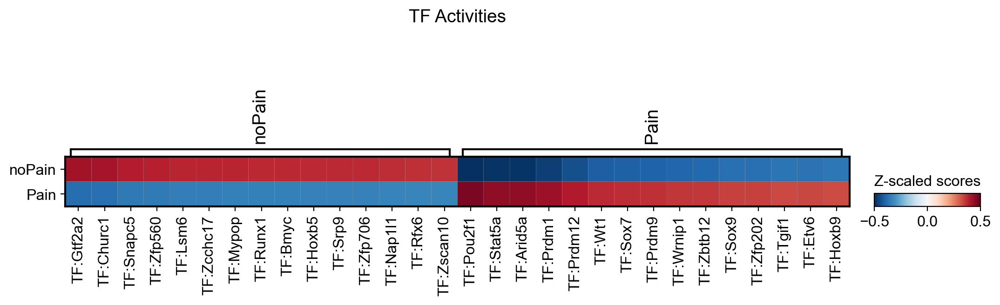

In [208]:
sc.pl.rank_genes_groups_matrixplot(noci_mdata['TF_activity'], n_genes=15, vmin=-0.5, vmax=0.5, cmap='RdBu_r',colorbar_title='Z-scaled scores', layer='scaled', title='TF Activities')

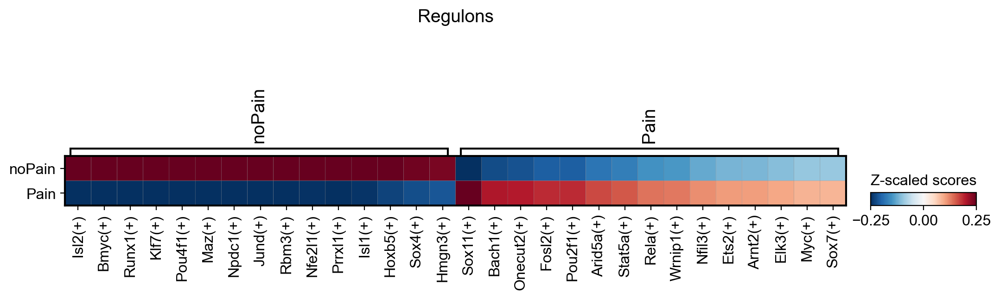

In [211]:
sc.pl.rank_genes_groups_matrixplot(noci_mdata['SCENIC'], n_genes=15, vmin=-.25, vmax=.25, cmap='RdBu_r',colorbar_title='Z-scaled scores', layer='scaled', title='Regulons')

In [2]:
noci_mdata = mu.read('./Results_h5ad/06_noci_mdata_SCENIC_TF.h5mu')

In [4]:
noci_mdata['TF_activity'].X = noci_mdata['TF_activity'].layers['TF_act']

In [12]:
noci_mdata['SCENIC'].X = noci_mdata['SCENIC'].layers['SCENIC']

In [14]:
noci_mdata['TF_activity'].obs.Conditions = noci_mdata['TF_activity'].obs.Conditions.cat.reorder_categories(['Naive', 'Sham', 'CFA', 'Paclitaxel', 'Crush', 'DRC', 'CCI', 'ScNT', 'SpNT'])

In [15]:
noci_mdata['SCENIC'].obs.Conditions = noci_mdata['SCENIC'].obs.Conditions.cat.reorder_categories(['Naive', 'Sham', 'CFA', 'Paclitaxel', 'Crush', 'DRC', 'CCI', 'ScNT', 'SpNT'])

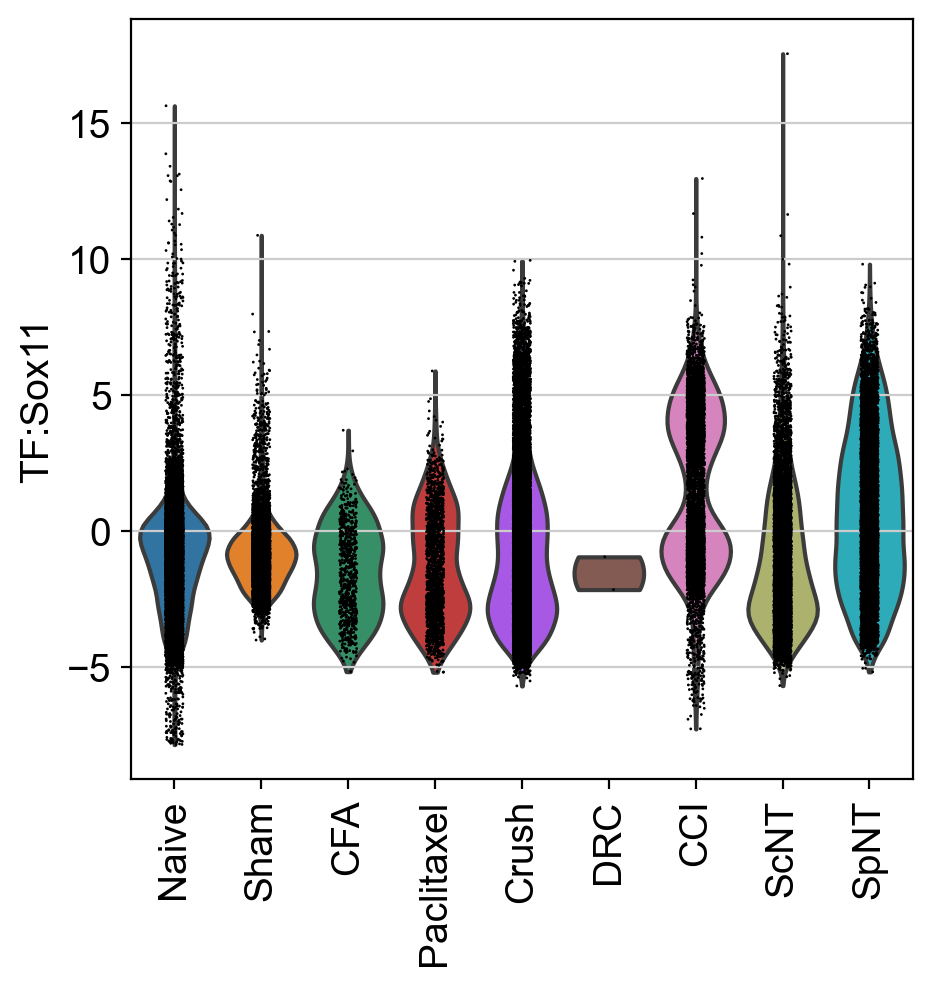

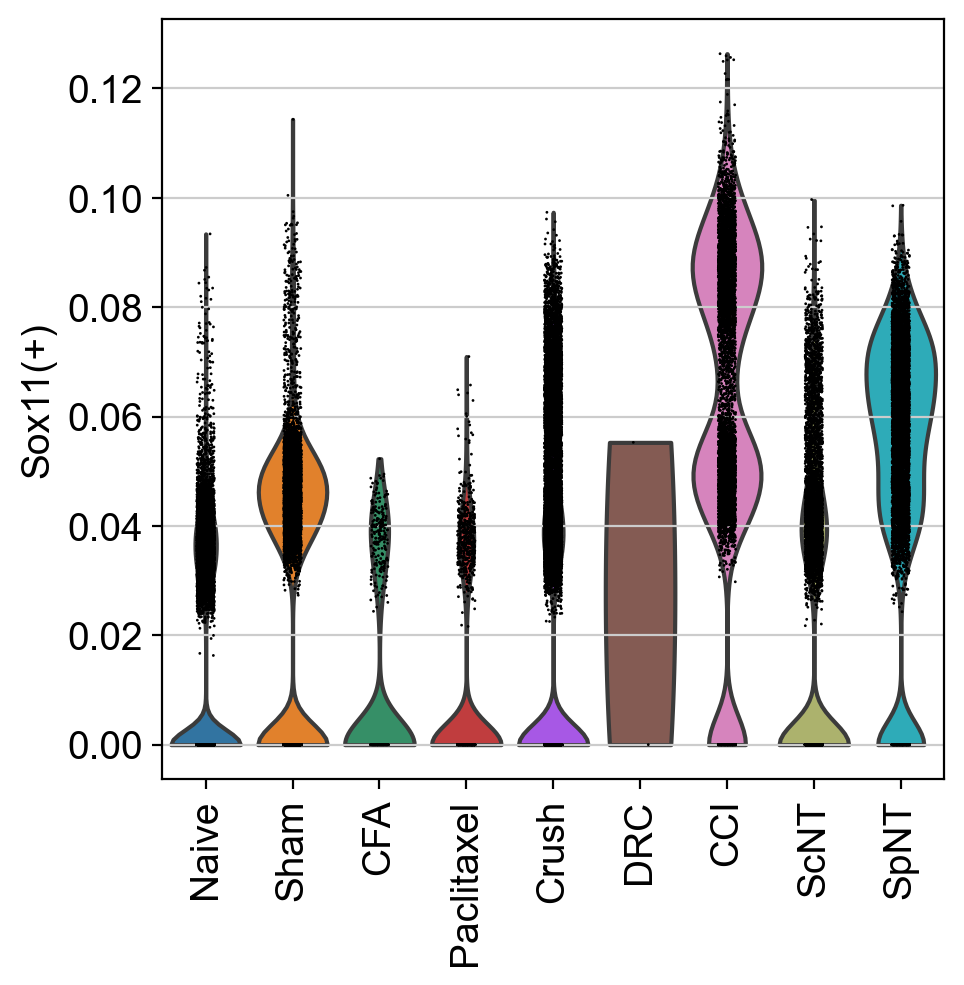

In [16]:
sc.pl.violin(noci_mdata['TF_activity'], keys='TF:Sox11', groupby='Conditions', layer='TF_act', rotation=90)
sc.pl.violin(noci_mdata['SCENIC'], keys='Sox11(+)', groupby='Conditions', layer='SCENIC', rotation=90)

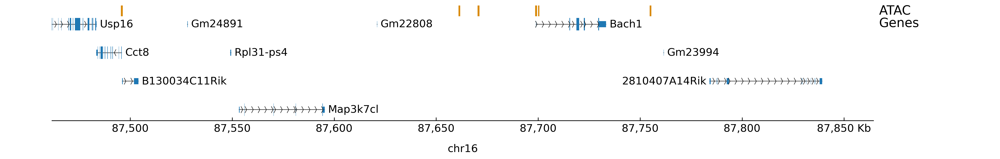

In [53]:
loc = noci_mdata['rna'].var.loc["Bach1"]
chrom = loc["Chromosome"]
chromLen = (loc["End"] - loc["Start"])
chromStart = loc["Start"] - chromLen
chromEnd = loc["End"] + chromLen + 300000
!pyGenomeTracks --dpi 300 --tracks drg_tracks.ini \
    --region {chrom}:{chromStart}-{chromEnd} \
    --outFileName drg_tracks.png 2> /dev/null
display.Image("drg_tracks.png", retina=True)

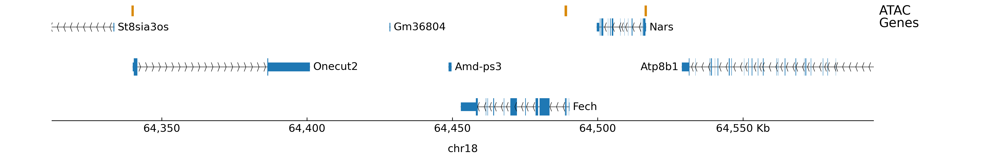

In [54]:
loc = noci_mdata['rna'].var.loc["Onecut2"]
chrom = loc["Chromosome"]
chromLen = (loc["End"] - loc["Start"])
chromStart = loc["Start"] - chromLen - 100000
chromEnd = loc["End"] + chromLen
!pyGenomeTracks --dpi 300 --tracks drg_tracks.ini \
    --region {chrom}:{chromStart}-{chromEnd} \
    --outFileName drg_tracks.png 2> /dev/null
display.Image("drg_tracks.png", retina=True)

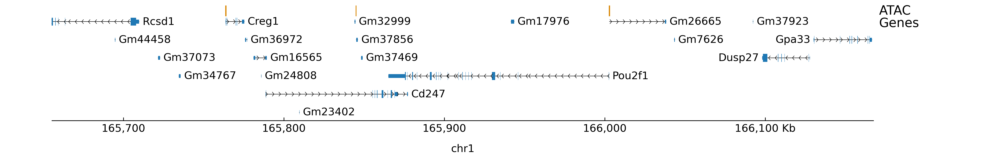

In [57]:
loc = noci_mdata['rna'].var.loc["Pou2f1"]
chrom = loc["Chromosome"]
chromLen = (loc["End"] - loc["Start"])
chromStart = loc["Start"] - chromLen +100000
chromEnd = loc["End"] + chromLen + 200000
!pyGenomeTracks --dpi 300 --tracks drg_tracks.ini \
    --region {chrom}:{chromStart}-{chromEnd} \
    --outFileName drg_tracks.png 2> /dev/null
display.Image("drg_tracks.png", retina=True)